In [4]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json
import time
import requests
from datetime import datetime, timedelta
from shapely.geometry import Point
from busSim import BusSim
from graph import Graph

In [7]:
DATA_PATH = "../data"
DAY = "monday"
START_TIME = "10:00:00"
ELAPSE_TIME = "00:30:00"
AVG_WALKING_SPEED = 1.4 # 1.4 meters per second
MAX_WALKING_MIN = 10

3137534.597146831

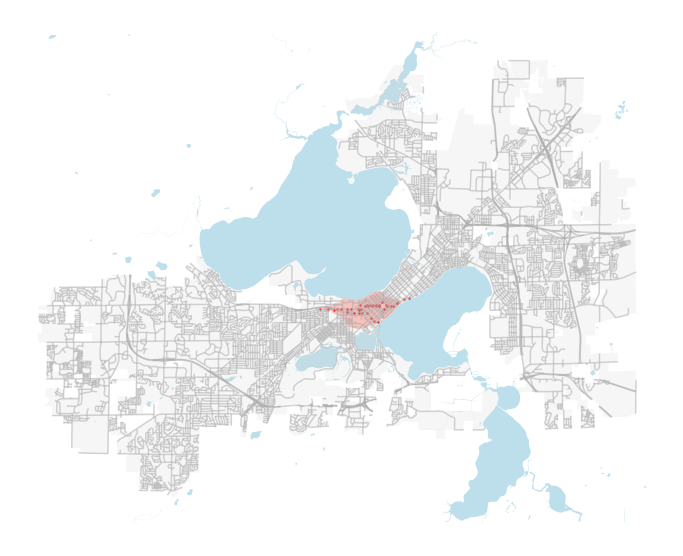

In [8]:
busSim = BusSim(DATA_PATH, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN, route_remove=[80])
gdf = busSim.get_gdf(765)
city = gpd.read_file("../data/plot/background/madison-shp")
lakes = gpd.read_file("../data/plot/background/water-shp")
street = gpd.read_file("../data/plot/background/street-shp")

ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)

ax.set_axis_off()
busSim.get_area(gdf) #3132638.580138589

21550622.595168628

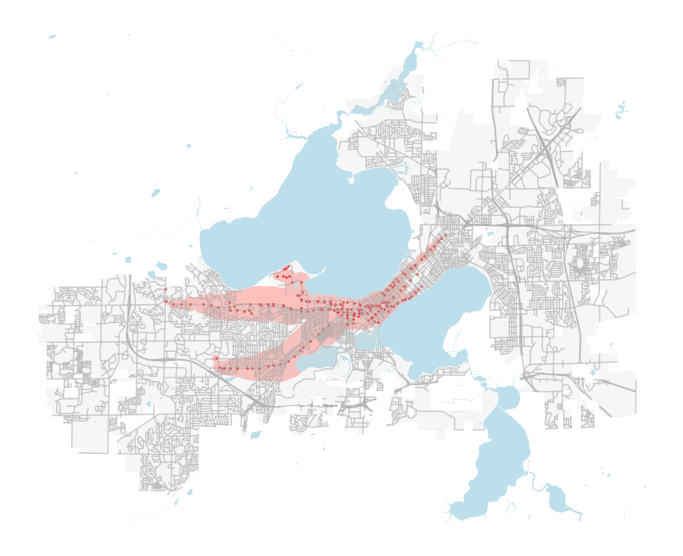

In [9]:
busSim = BusSim(DATA_PATH, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN)
gdf = busSim.get_gdf(765)
city = gpd.read_file("../data/plot/background/madison-shp")
lakes = gpd.read_file("../data/plot/background/water-shp")
street = gpd.read_file("../data/plot/background/street-shp")

ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)

ax.set_axis_off()
busSim.get_area(gdf) #21786807.680050697

In [10]:
df = busSim.stopTimes_final_df
# df[df["stop_id"] == 765]
df

,service_id,route_short_name,trip_id,stop_id,stop_sequence,arrival_time,shape_dist_traveled,stop_lat,stop_lon,cardinal_direction
10522,94_WKD,2,1025865,2146,33,0 days 10:00:07,5.5634,43.072801,-89.421956,270.0
32047,94_WKD,8,1027256,2637,10,0 days 10:00:09,1.7232,43.068706,-89.454013,90.0
16603,94_WKD,10,1027460,1262,6,0 days 10:00:12,0.6739,43.094118,-89.353693,180.0
14756,94_WKD,7,1026920,1689,40,0 days 10:00:12,7.0684,43.083665,-89.361729,90.0
17974,94_WKD,4,1026201,506,38,0 days 10:00:16,5.7677,43.074974,-89.395500,270.0
...,...,...,...,...,...,...,...,...,...,...
34338,94_WKD:R,80,1031121,2996,7,0 days 10:29:52,0.8845,43.076534,-89.413067,270.0
14282,94_WKD,4,1026162,1167,32,0 days 10:29:56,5.2328,43.077867,-89.369993,90.0
29036,94_WKD,7,1026919,2597,5,0 days 10:29:56,0.8818,43.049921,-89.463235,90.0
45371,94_WKD,26,1029126,9932,12,0 days 10:29:57,4.3538,43.146141,-89.297845,180.0


21550622.595168628

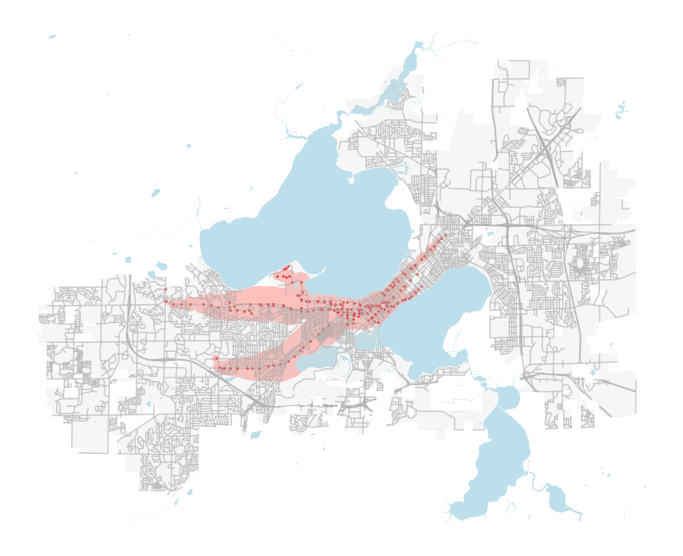

In [11]:
busSim = BusSim(DATA_PATH, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN, trip_delays=[(1024695, "00:04:00")])
gdf = busSim.get_gdf(765)
city = gpd.read_file("../data/plot/background/madison-shp")
lakes = gpd.read_file("../data/plot/background/water-shp")
street = gpd.read_file("../data/plot/background/street-shp")

ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)

ax.set_axis_off()
busSim.get_area(gdf) #20682522.238682237

In [7]:
def fmin(minutes):
    return f"{minutes // 60}:{minutes % 60}:00"

perf = pd.DataFrame()

for t in [10, 20, 30, 40, 50, 60, 70]:
    print(t)
    t0 = time.time()
    busSim = BusSim(DATA_PATH, DAY, START_TIME, fmin(t), AVG_WALKING_SPEED, MAX_WALKING_MIN)
    t1 = time.time()
    gdf = busSim.get_gdf(765)
    t2 = time.time()
    perf.loc[t, "graph-gen"] = t1 - t0
    perf.loc[t, "gen-dataframe"] = t2 - t1

perf

10
20
30
40
50
60
70


,graph-gen,gen-dataframe
10,1.436198,0.409311
20,1.951993,0.421162
30,2.763028,0.458929
40,4.001885,0.524373
50,5.417288,0.595346
60,7.324164,0.663643
70,9.583204,0.772307


In [7]:
def fmin(minutes):
    return f"{minutes // 60}:{minutes % 60}:00"

perf = pd.DataFrame()

for t in [10, 20, 30, 40, 50, 60, 70, 80, 90]:
    print(t)
    t0 = time.time()
    busSim = BusSim(DATA_PATH, DAY, START_TIME, fmin(t), AVG_WALKING_SPEED, MAX_WALKING_MIN)
    t1 = time.time()
    gdf = busSim.get_gdf(765)
    t2 = time.time()
    perf.loc[t, "graph-gen"] = t1 - t0
    perf.loc[t, "gen-dataframe"] = t2 - t1

perf

10
20
30
40
50
60
70
80
90


,graph-gen,gen-dataframe
10,2.371566,0.488549
20,5.317778,0.468277
30,8.024877,0.496054
40,14.320786,0.550134
50,22.208937,0.660678
60,29.134297,0.692343
70,40.825069,0.817672
80,52.399530,0.841997
90,65.533037,0.908638
